<a href="https://githubtocolab.com/giswqs/geemap/blob/master/examples/notebooks/35_geemap_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open in Colab"/></a>
# Timbre-Aware Pitch Estimator
TAPE is a novel pitch estimator (or pitch stream segregator) improving ***blind*** pitch estimation with the help of timbre-specific priors. As a proof-of-concept, we present it with a real-world use case on violin--piano duets, one of the most common scenarios in chamber music. 

The conventional method for estimating the violin pitch in a violin--piano duet has two-stages (a). However, our end-to-end timbre-aware pitch estimator attends to the target violin timbre directly from the mixture waveform, and can estimate the violin pitch with high precision (b).

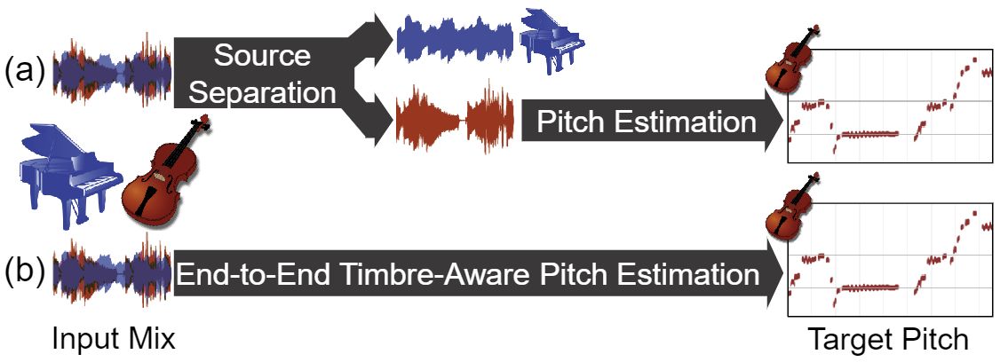

In [24]:
#@markdown In this
#@markdown demo notebook you can sonify the timbre-focused pitch track
#@markdown of the violin from violin-piano duets. You can use the predetermined
#@markdown videos or paste the YouTube key of any violin--piano duet 
#@markdown recording from YouTube.
#@markdown You can also specify the analysis start and end timestamps in seconds.
#@markdown We recommend using video durations of upto 2-3 minutes, otherwise
#@markdown the computation might take too long. 

#@markdown **Please run this cell to install the dependencies.**


!rm -rf tape # remove if the directory already exists
!git clone https://github.com/MTG/tape.git
!pip install mir_eval  &> /dev/null
!pip install libf0  &> /dev/null
!pip install yt-dlp  &> /dev/null
!pip install crepe  &> /dev/null
import IPython.display as ipd
import libf0
import torch
import librosa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tape.pitch_estimator import TAPE

def predict_from_youtube_timestamps(youtube_keys, window_size, hop_length=256,
                                    batch_size=256, viz_compare=False):
  device = 'cuda' if torch.cuda.is_available() else 'cpu'
  model = TAPE(instrument="violin", 
               window_size=window_size,
               hop_length=hop_length).to(device)
  for name, (key, start, end) in youtube_keys.items():
    ipd.display(ipd.YouTubeVideo(key, width=1000, start=start, end=end)) # youtube video has a different convention for end
    !yt-dlp https://www.youtube.com/watch?v={key} -x --audio-format wav --audio-quality 0   -o "{name}.%(ext)s" &> /dev/null
    audio, sr = librosa.load(name+'.wav', sr=model.sr, offset=start, duration=end-start)
    print('Sonified pitch track with TAPE using an attendant stream window of', window_size/model.sr, 'seconds')
    with torch.no_grad():
      time, frequency_our, confidence_our, activation_our = model.predict(torch.tensor(audio), viterbi=False, batch_size=batch_size)

    confident_freq = frequency_our.copy()
    confident_freq[confidence_our<0.7] = 0
    confident_sonified = libf0.sonify_trajectory_with_sinusoid(confident_freq, time, len(audio), Fs=sr)
    ipd.display(ipd.Audio(np.vstack((confident_sonified.reshape(1, -1), 0.5*audio.reshape(1, -1))), rate=sr, normalize=True))
    if viz_compare:
        import crepe
        time_crepe, frequency_crepe, confidence_crepe, activation_crepe = crepe.predict(audio, model.sr, viterbi=True, verbose=0)
        print('Sonified pitch track with CREPE using Viterbi')
        confident_crepe = frequency_crepe.copy()
        confident_crepe[confident_crepe<0.7] = 0
        confident_sonified = libf0.sonify_trajectory_with_sinusoid(confident_crepe, time_crepe, len(audio), Fs=sr)
        ipd.display(ipd.Audio(np.vstack((confident_sonified.reshape(1, -1), 0.5*audio.reshape(1, -1))), rate=sr, normalize=True))

        ipd.display(visualize([{
            'CREPE': pd.DataFrame({'time':time_crepe, 'frequency':frequency_crepe}), 
            'Violin-TAPE': pd.DataFrame({'time':time, 'frequency':confident_freq}),
           }], t_scale=2, f_scale=2,
            labeling_hz=model.labeling.centers_hz[:-120]))

# only for comparison with CREPE
def visualize(list_of_dicts_time_frequency_dfs, labeling_hz, t=5, t_scale=1, f_scale=1):
    '''
    Input: [  {'estimator name' (or 'ground'): (time, frequency) dataframe}
              {other track prediction dicts in the same fashion}...,
              or,
              activation matrix (ndarray) of a neural network output ]
    '''
    dur_s = t
    colors = ['k', 'r', 'b', 'g', 'm', 'darkorange', 'y']
    yticks = [196, 293.7, 440, 660, 987.77]
    
    yticklabels = [r'$\mathrm{G_{3}}$', r'$\mathrm{D_{4}}$', r'$\mathrm{A_{4}}$', r'$\mathrm{E_{5}}$', r'$\mathrm{B_{5}}$']
    min_label = np.argmax(labeling_hz[labeling_hz<yticks[0]-20])
    fmin, fmax = labeling_hz[min_label], labeling_hz[-1]
    ylim = [fmin, fmax]
    cm = 2.2 / 2.54  # centimeters in inches'$\mathrm{D_{4}}$'
    fig, axes = plt.subplots(len(list_of_dicts_time_frequency_dfs), 1, sharex=True, figsize=((2*dur_s*cm*f_scale), (9/4)*len(list_of_dicts_time_frequency_dfs)*cm*f_scale))
    try:
      xlim = max([next(iter(dict_of_time_frequency_dfs.values()))['time'].iloc[-1] for dict_of_time_frequency_dfs in list_of_dicts_time_frequency_dfs])
    except AttributeError:
      xlim = next(iter(list_of_dicts_time_frequency_dfs[0].values()))['time'].iloc[-1]
    if not hasattr(axes, '__len__'):
      axes = [axes]
    for i, dict_of_time_frequency_dfs in enumerate(list_of_dicts_time_frequency_dfs):
      try:
        dur = next(iter(dict_of_time_frequency_dfs.values()))['time'].iloc[-1]
        for j, (label, time_frequency_df) in enumerate(dict_of_time_frequency_dfs.items()):
          time_frequency_df.plot.scatter(x='time', y='frequency', ax = axes[i], grid=True, xlim=[0, xlim], ylim=ylim, yticks=None, logy=True, label=label, color=colors[j], alpha=0.7, s=3)
        axes[i].set_yticks(yticks)
      except: #then it is activation of a nn
        act = dict_of_time_frequency_dfs[:, min_label:].T
        cmap = {'b':'Blues', 'r':'Reds', 'g':'Greens', 'm':'Purples', 'darkorange':'Oranges', 'k':'Greys', 'y':'YlOrBr'}
        axes[i].imshow(act, aspect="auto", origin="lower", cmap=cmap[colors[i]], extent=[0, xlim, np.log(fmin), np.log(fmax)])
        axes[i].grid()
        axes[i].set_yticks(np.log(yticks))
        axes[i].set_ylabel('activations')
      
      axes[i].set_yticklabels([],minor=True)
      axes[i].set_yticklabels(yticklabels, fontsize=14)
    xticks = range(0, int(dur)+1, int(1))
    axes[i].set_xticks(xticks)
    axes[i].set_xticklabels(list(range(len(xticks))), fontsize=14)
    axes[i].set_xlabel('time in seconds')
    
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.close()
    return fig


Cloning into 'tape'...
remote: Enumerating objects: 67, done.
remote: Counting objects: 100% (67/67), done.
remote: Compressing objects: 100% (65/65), done.
remote: Total 67 (delta 30), reused 4 (delta 0), pack-reused 0
Unpacking objects: 100% (67/67), done.


# An example with two microphone placements:


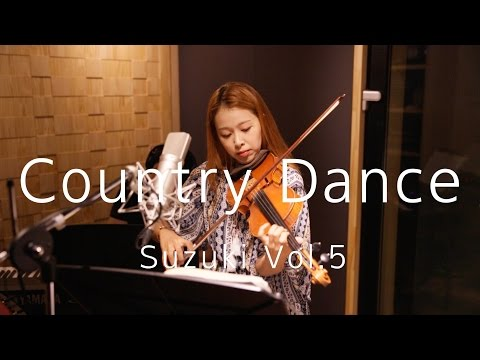

Sonified pitch track with TAPE using an attendant stream window of 1.024 seconds


Sonified pitch track with CREPE using Viterbi


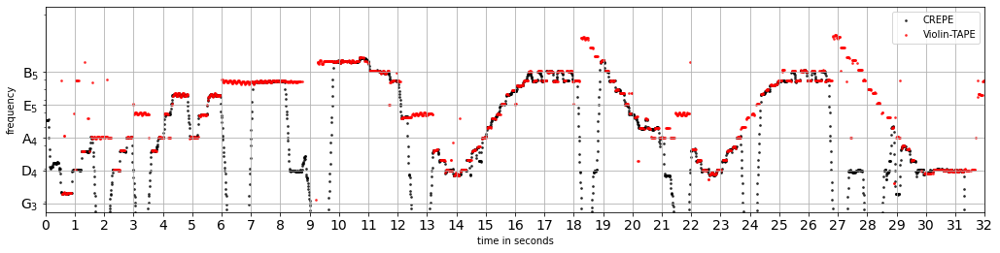

In [25]:
#@markdown ##Everything is easy when the microphone is in front of the violin.
#@markdown You can see that CREPE and TAPE mostly agree here.
#@markdown Yet, the Viterbi implementation of CREPE results in
#@markdown an extremely unrealistic pitch curve for violin.
easy = {'Everything is easy when the microphone is in front of violin.': ['FON5pGE_KmY', 0, 32]}
predict_from_youtube_timestamps(easy, window_size = 16*1024, 
                                batch_size=64, viz_compare=True)

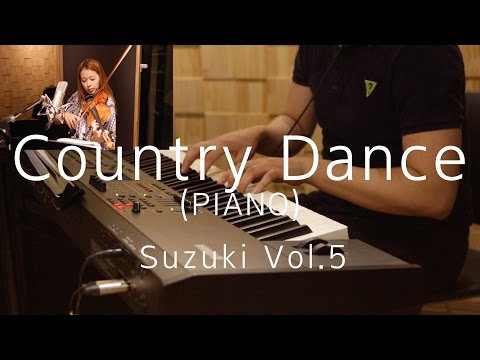

Sonified pitch track with TAPE using an attendant stream window of 1.024 seconds


Sonified pitch track with CREPE using Viterbi


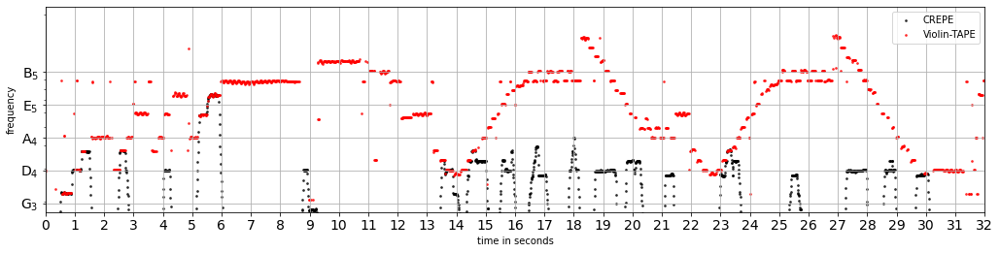

In [26]:
#@markdown ##But what happens when they put the microphone away?
#@markdown TAPE can still attend to the violin. 
#@markdown No matter if it is predominant or not.
#@markdown Meanwhile, CREPE outputs the dominant piano pitch as expected.
hard = {'hard': ['stgcjJySr4c', 0, 32]}
predict_from_youtube_timestamps(hard, window_size = 16*1024, 
                                batch_size=64, viz_compare=True)

# Other examples & How to format your own YouTube links
Below you can find more examples. If you want to track the violin pitch in your own violin--piano videos (stored in YouTube), you can also do it quite simply. Please observe the dictionary in the cell below. You can assign any name as key. Then the array consists YouTube video ID, analysis start and end in seconds. 

---

For example, for the following link:

https://www.youtube.com/watch?v=stgcjJySr4c

The video ID is what you see after v=. In this case, stgcjJySr4c.
You can decide the analysis start and end on your own. However, you need to convert the timestamps to seconds. The previous example was generated from t₁=0s to t₂=32s:


```
example_dict = {'arbitrary_name': ['stgcjJySr4c', 0, 32]
```

You can run the cell below with your own video IDs or the predetermined ones.


In [ ]:
youtube_vids = {'prokofiev_sonata1': ['b5pBnp9LZ9g', 8, 60],
                'vitali_chaconne': ['AloBa9SPM7U', 2*60+10, 3*60],
                'beethoven_romance': ['OQ15WXF6kgk', 2*60+54, 3*60+17],
                'wieniawski_romance': ['w8Xwqj1MaS0', 0, 53],
                'beethoven_sonata8': ['COGcCBJAC6I', 4*60+12, 4*60+37],
                'kabalyevski_concerto': ['6hndlBqMeEk', 56, 93],
                #'stravinsky_tango': ['aSMHxVU01x4', 16, 34],
                #'kreisler_rosmarin': ['M8uawG42BvQ', 16, 43],
                }
predict_from_youtube_timestamps(youtube_vids, 
                                window_size = 32*1024, #32*1024/16000=2.054s
                                hop_length=256)        #256/16000=16ms